## Columnes
genre: The genre in which the track belongs.

artist_name: The artists' names who performed the track

track_name: Name of the track

track_id: The Spotify ID for the track

popularity: The popularity of a track is a value between 0 and 100

acousticness: A confidence measure from 0.0 to 1.0 of whether the track is acoustic

danceability: Danceability describes how suitable a track is for dancing based

duration_ms: The track length in milliseconds

energy: Measure of intensity and activity from 0.0 to 1.0

instrumentalness: Predicts whether a track contains no vocals (nearer 1=no vocals)

key: The key the track is in

liveness: Detects the presence of an audience in the recording (higher 0.8=live)

loudness: The overall loudness of a track in decibels (dB)

mode: Mode indicates the scale (major or minor) of a track

speechiness: Speechiness detects the presence of spoken words in a track

tempo: The overall estimated tempo of a track in beats per minute

time_signature: An estimated time signature

valence: A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track

# A) Carregar llibreries

In [7]:
##A)Carregar llibreries
import pandas as pd ###py -m pip install pandas
import numpy as np ###py -m pip install numypy

from sklearn.decomposition import PCA, KernelPCA, TruncatedSVD ###py -m pip install scikit-learn
from sklearn.preprocessing import StandardScaler, OneHotEncoder, MinMaxScaler
from sklearn.cluster import KMeans, HDBSCAN, DBSCAN, MiniBatchKMeans 
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score
from sklearn.manifold import TSNE
from sklearn.mixture import GaussianMixture

from yellowbrick.cluster import KElbowVisualizer ##py -m pip install yellowbrick

import seaborn as sns ##py -m pip install seaborn

import random

import matplotlib.pyplot as plt ##py -m pip install matplotlib

from scipy.spatial.distance import euclidean

# B) Carregar dataset

In [8]:
##B)Carregar el dataset
df = pd.read_csv('SpotifyFeatures.csv')
#print(df.head()) #Mostra 5 rows
print(df.info()) #Mostra el tipus de columns: df.dtypes

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 232725 entries, 0 to 232724
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   genre             232725 non-null  object 
 1   artist_name       232725 non-null  object 
 2   track_name        232724 non-null  object 
 3   track_id          232725 non-null  object 
 4   popularity        232725 non-null  int64  
 5   acousticness      232725 non-null  float64
 6   danceability      232725 non-null  float64
 7   duration_ms       232725 non-null  int64  
 8   energy            232725 non-null  float64
 9   instrumentalness  232725 non-null  float64
 10  key               232725 non-null  object 
 11  liveness          232725 non-null  float64
 12  loudness          232725 non-null  float64
 13  mode              232725 non-null  object 
 14  speechiness       232725 non-null  float64
 15  tempo             232725 non-null  float64
 16  time_signature    23

# C) Preparar dades

In [9]:
##C)Preparar dades
#1) Tractar duplicats
#Quantitat duplicats
print("Quantitat de dupplicats:", df.duplicated(subset="track_id", keep="first").sum())
#print(df[df.duplicated(subset="track_id", keep=False)]) Veure files dels duplicats

#Treure duplicats (files)
df.drop_duplicates(subset="track_id", keep="first", inplace=True)
print("Quantitat de dupplicats després:", df.duplicated(subset="track_id", keep="first").sum())
print("New shape sense duplicats:", df.shape)

Quantitat de dupplicats: 55951
Quantitat de dupplicats després: 0
New shape sense duplicats: (176774, 18)


In [10]:
#2) Corretgir valors errònis (impossibles)
#Comprovar valors de key, mode i time_signature
#print("Key values:", df['key'].value_counts())
#print("Mode values:", df["mode"].value_counts())
#print("Time_signature values:", df["time_signature"].value_counts())
#print("Genre values::", df["genre"].value_counts())

#Eliminar key: "0/4" (impossible)
print("Quantitat de '0/4'abans:", (df["time_signature"] == "0/4").sum()) #Quantitat key: "0/4"
df = df[df["time_signature"] != "0/4"]
print("Quantitat de '0/4' després:", (df["time_signature"] == "0/4").sum())
print("New shape sense '0/4':", df.shape)

#Substituir Children’s Music per Children's Music 
print("Quantitat de Children’s Music abans:", (df["genre"] == "Children’s Music").sum()) 
print("Quantitat de Children's Music abans:", (df["genre"] == "Children's Music").sum()) 
df.loc[df["genre"]=="Children’s Music", "genre"] = "Children's Music"
print("Quantitat de Children’s Music desrpés:", (df["genre"] == "Children’s Music").sum()) 
print("Quantitat de Children's Music després:", (df["genre"] == "Children's Music").sum()) 
print("New valors de genre sense Children’s Music :", df["genre"].nunique())

#Eliminar NaN
print("Quantitat de Nan abans:", df.isna().sum().sum()) #Quantitat Nan en tot df
#print("NaN per features:", df.isna().sum())
df.dropna(axis=0, inplace=True) #
print("Quantitat de Nan després:", df.isna().sum().sum())
print("New shape sense Nan:", df.shape)

Quantitat de '0/4'abans: 6
Quantitat de '0/4' després: 0
New shape sense '0/4': (176768, 18)
Quantitat de Children’s Music abans: 1339
Quantitat de Children's Music abans: 5402
Quantitat de Children’s Music desrpés: 0
Quantitat de Children's Music després: 6741
New valors de genre sense Children’s Music : 26
Quantitat de Nan abans: 1
Quantitat de Nan després: 0
New shape sense Nan: (176767, 18)


In [11]:
#3) Eliminar columnes 
#Reiniciar index en dataframe
df.reset_index(drop=True, inplace=True)

#Guardar columnes: 'track_name', 'artist_name'
canciones = df[["track_name", "artist_name"]]

#track_name = df[["track_name"]]
#artist_name = df[["artist_name"]]

#Drop olumnes: 'artist_name','track_name','track_id 
df.drop(['artist_name','track_name','track_id', 'genre', 'popularity'], axis=1, inplace=True) #Elimina les columnes modificant df og
print(f"Nova shape sense artist_name, track_name, track_id: {df.shape}") #Mostra rowsxcolumns

num_col = df.select_dtypes(exclude="object").columns
cat_col = df.select_dtypes(include="object").columns

Nova shape sense artist_name, track_name, track_id: (176767, 13)


In [12]:
#4)Codificar columnes no numèriques
#Diccionari
df4 = df.copy(deep=True)
mode_dict = {'Major' : 1, 'Minor' : 0}
key_dict = {'C' : 1, 'C#' : 2, 'D' : 3, 'D#' : 4, 'E' : 5, 'E#': 6, 
            'F' : 7, 'F#' : 8, 'G' : 9, 'G#' : 10, 'A' : 11, 'A#' : 12,
            'B' : 13, 'B#' : 14}
time_signature_dict = {'1/4' : 1, '3/4' : 3, '4/4' :4, "5/4": 5}
#Codificar columna key 
df4["key"] = df4["key"].map(key_dict)
#Codificar columna mode 
df4["mode"] = df4["mode"].map(mode_dict)
#Codificar columna time_signature
df4["time_signature"] = df4["time_signature"].map(time_signature_dict)

print("Nova shape df4:", df4.shape)
print("Noves columnas:", df4.columns)

Nova shape df4: (176767, 13)
Noves columnas: Index(['acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
       'speechiness', 'tempo', 'time_signature', 'valence'],
      dtype='object')


(array([[<Axes: title={'center': 'acousticness'}>,
         <Axes: title={'center': 'danceability'}>,
         <Axes: title={'center': 'duration_ms'}>,
         <Axes: title={'center': 'energy'}>],
        [<Axes: title={'center': 'instrumentalness'}>,
         <Axes: title={'center': 'key'}>,
         <Axes: title={'center': 'liveness'}>,
         <Axes: title={'center': 'loudness'}>],
        [<Axes: title={'center': 'mode'}>,
         <Axes: title={'center': 'speechiness'}>,
         <Axes: title={'center': 'tempo'}>,
         <Axes: title={'center': 'time_signature'}>],
        [<Axes: title={'center': 'valence'}>, <Axes: >, <Axes: >,
         <Axes: >]], dtype=object),)

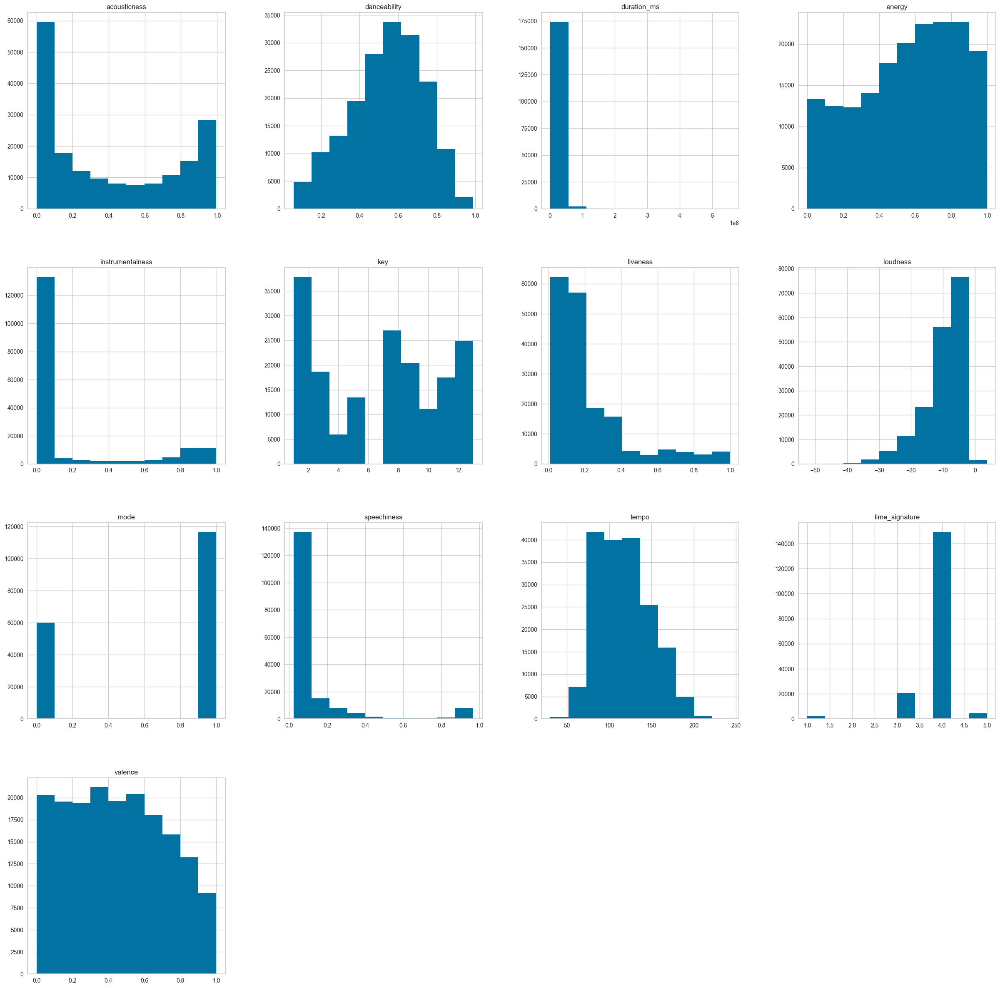

In [13]:
#5) Mirar histograma
df4.hist(figsize=(30, 30)), 

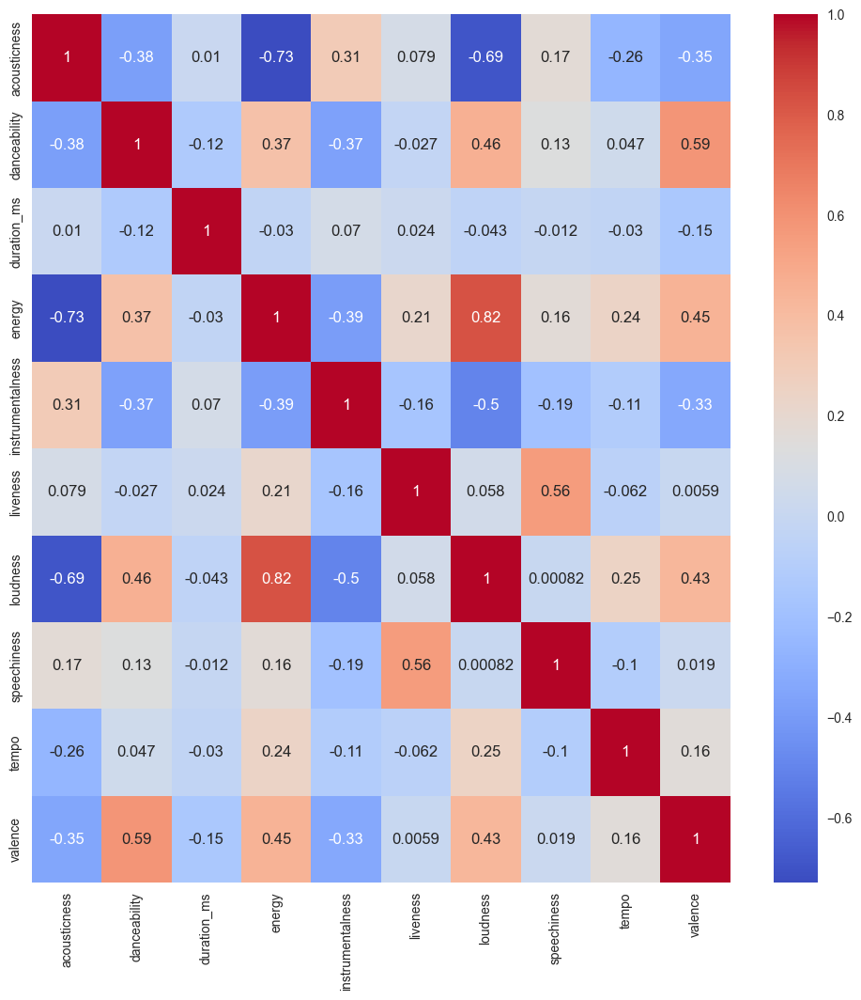

In [14]:
#6) Mirar correlació (pearson)
corr_matrix3 = df4[num_col].corr()
plt.figure(figsize=(12, 12))
ax = sns.heatmap(corr_matrix3, annot=True, cmap='coolwarm')
plt.show()

In [25]:
#7) Escalar columnes
scaler = MinMaxScaler()
tmp = df4.copy()
tmp["duration_ms"] = scaler.fit_transform(df4[["duration_ms"]])
tmp["loudness"] = scaler.fit_transform(df4[["loudness"]])
tmp["tempo"] = scaler.fit_transform(df4[["tempo"]])
tmp["key"] = scaler.fit_transform(df4[["key"]])
tmp["time_signature"] = scaler.fit_transform(df4[["time_signature"]])

data4_scal = tmp.values
#df4_scal = pd.DataFrame(data=data4_scal, columns=df4.columns)

# D) Establir model

## 1) KMeans

Exception in thread Thread-76 (_readerthread):
Traceback (most recent call last):
  File "c:\Users\gaofu\anaconda3\Lib\threading.py", line 1038, in _bootstrap_inner
    self.run()
  File "c:\Users\gaofu\anaconda3\Lib\site-packages\ipykernel\ipkernel.py", line 766, in run_closure
    _threading_Thread_run(self)
  File "c:\Users\gaofu\anaconda3\Lib\threading.py", line 975, in run
    self._target(*self._args, **self._kwargs)
  File "c:\Users\gaofu\anaconda3\Lib\subprocess.py", line 1597, in _readerthread
    buffer.append(fh.read())
                  ^^^^^^^^^
  File "<frozen codecs>", line 322, in decode
UnicodeDecodeError: 'utf-8' codec can't decode byte 0xa2 in position 116: invalid start byte


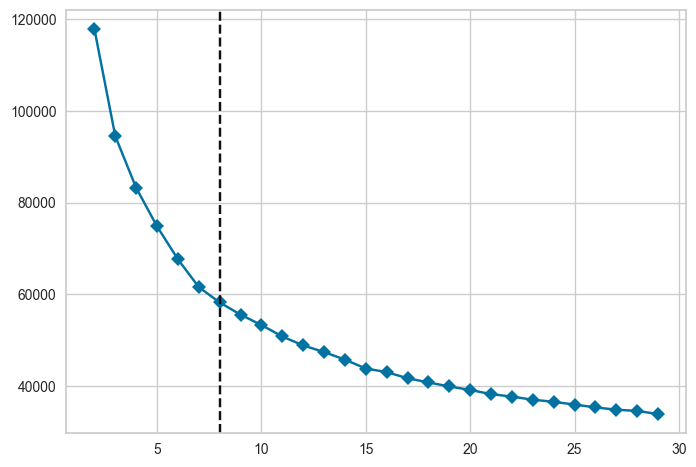

In [30]:
#DATASET3
#1) Calcular k millor
model = KMeans(n_init=10, random_state=0)
visualizer = KElbowVisualizer(model, k=(2,30), timings=False, metric='distortion') #default distance_metric: euclidean
visualizer.fit(data4_scal)       
#visualizer.show() #Quitar en py
#visualizer.show(outpath="kmeans.png") #Guardar gráfica
k = visualizer.elbow_value_ #millor k
#2) Entrenar i predir amb KMEANS
kmeans = KMeans(n_clusters=k, n_init=10, random_state=0)
#kmeans = MiniBatchKMeans(n_clusters=k, n_init=10, random_state=0)
kmeans1 = kmeans.fit_predict(data4_scal) #Mateix que: kmeans.labels__
#data_scal["cluster"] = pred

## 2) DBSCAN

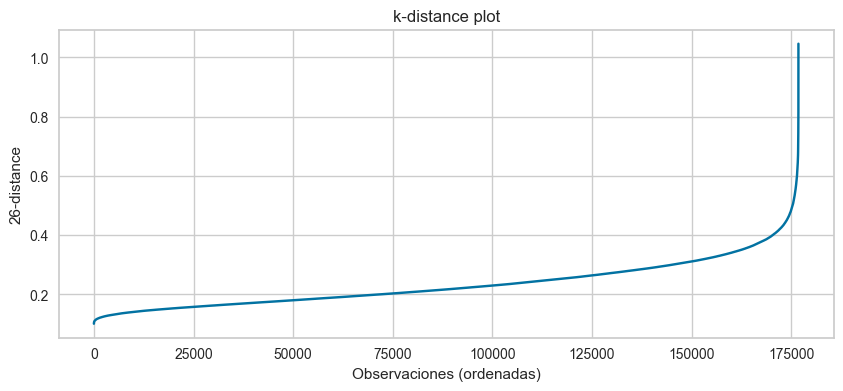

0.48639595112992084


In [31]:
#DATASET3
#1) Calcular eps
min_samples = 2 * data4_scal.shape[1]
nn = NearestNeighbors(n_neighbors=min_samples).fit(data4_scal) #default algorithm: auto; most appropiate, default metric: minkowski
dists, _ = nn.kneighbors(data4_scal)
kdist = np.sort(dists[:, -1])
plt.figure(figsize=(10,4))
plt.plot(kdist, label=f'{min_samples}-distance sorted')
plt.title('k-distance plot')
plt.xlabel('Observaciones (ordenadas)')
plt.ylabel(f'{min_samples}-distance')
plt.savefig("dbscan.png")
plt.show()
print(kdist[175000])

In [32]:
#2) Entrenar i predir amb DBSCAN
min_samples = 2 * data4_scal.shape[1]
dbscan = DBSCAN(eps=0.42, min_samples=min_samples, n_jobs=-1,) #default algorithm: auto of NearestNeighbours; most appropiate
dbscan1 = dbscan.fit_predict(data4_scal)
#print(calinski_harabasz_score(data4_scal, dbscan1), davies_bouldin_score(data4_scal, dbscan1))

## 3) HDBSCAN

In [33]:
#DATASET3
#1) Entrenar i predir amb HDBSCAN
min_samples = 2 * data4_scal.shape[1]
hdbscan = HDBSCAN(min_cluster_size=min_samples, min_samples=min_samples, n_jobs=-1, store_centers="centroid") #default metric: euclidean
hdbscan1 = hdbscan.fit_predict(data4_scal)

## 4) Gaussian Mixture

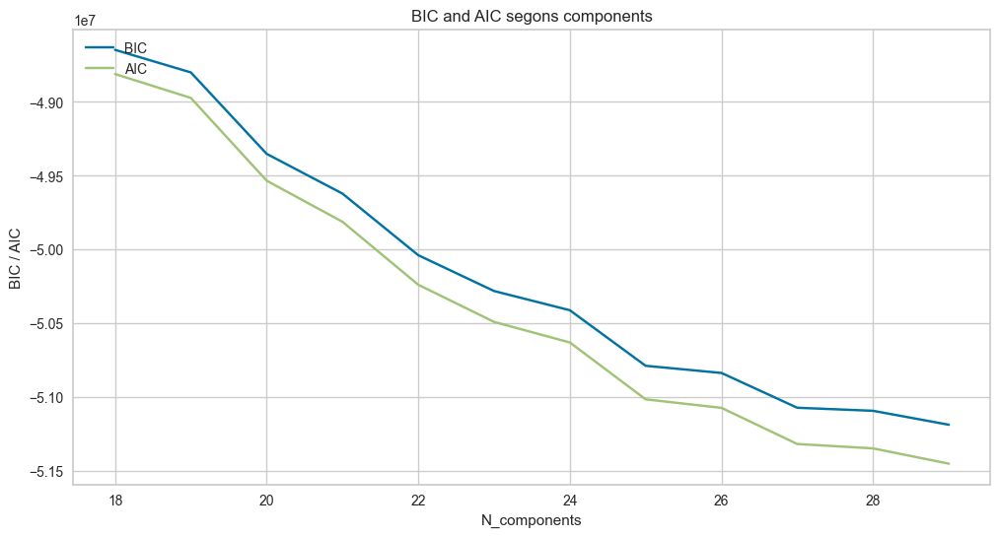

In [ ]:
#DATASET3
#1) Trobar n_components
n_components_range = range(18, 30)
bics = []
aics = []

for n in n_components_range:
    gmm = GaussianMixture(n_components=n, n_init=10, random_state=0)
    gmm.fit(data4_scal)
    bics.append(gmm.bic(data4_scal))
    aics.append(gmm.aic(data4_scal))

plt.figure(figsize=(12, 6))
plt.plot(n_components_range, bics, label='BIC')
plt.plot(n_components_range, aics, label='AIC')
plt.xlabel('N_components')
plt.ylabel('BIC / AIC')
plt.legend(loc=2)
plt.title('BIC and AIC segons components')
plt.savefig("gm.png")
plt.show()

In [ ]:
#DATASET3
#2) Entrenar i predir amb GM
gm = GaussianMixture(n_components=25, n_init=10, random_state=0) #default covariance_type: full 
gm1 = gm.fit_predict(data4_scal)

# E) Evaluar models

In [34]:
#KMEANS
print(calinski_harabasz_score(data4_scal, kmeans1), davies_bouldin_score(data4_scal, kmeans1))

43253.78065128086 1.4833560741661576


In [35]:
#DBSCAN
print(calinski_harabasz_score(data4_scal, dbscan1), davies_bouldin_score(data4_scal, dbscan1))

9297.747454031443 1.922812264836684


In [36]:
#HDBSCAN
print(calinski_harabasz_score(data4_scal, hdbscan1), davies_bouldin_score(data4_scal, hdbscan1))

13766.718790306575 2.350803328576115


In [ ]:
#GaussianMixture
print(calinski_harabasz_score(data4_scal, gm1), davies_bouldin_score(data4_scal, gm1))

21364.7696365001 0.8837005835017352


In [37]:
#len(set(kmeans1)), len(set(dbscan1)), len(set(hdbscan1)), len(set(gm1))
len(set(kmeans1)), len(set(dbscan1)), len(set(hdbscan1))

(8, 8, 6)

# F) Visualitzar clústers

In [38]:
# Crear sampled dataset per proves més ràpides
# Samplearem 15% de les dades per a proves
sample_size = int(len(df) * 0.15)
#sample_size = int(len(df) * 0.15 / len(set(hdbscan1)))

#df4_kmeans1 = pd.DataFrame(data=data4_scal, columns=df4.columns)
#df4_kmeans1["label"] = hdbscan1
#sample_indices = df4_kmeans1.groupby("label").apply(lambda x: x.sample(sample_size, random_state=0) if len(x) >= sample_size else x, include_groups=False).droplevel("label").index
sample_indices = np.random.RandomState(42).choice(len(df), sample_size, replace=False)

df4_sample = data4_scal[sample_indices]
#pred= pred[sample_indices]
print("Mida orignal:", df.shape)
print("Mida 20%:", df4_sample.shape)

Mida orignal: (176767, 13)
Mida 20%: (26515, 13)


## 1) HDBSCAN

In [39]:
# 1. PCA Estàndard
pca_sample = PCA(n_components=2, random_state=42)
df4_sample_pca = pca_sample.fit_transform(df4_sample)

df4_sample_pca_2 = pd.DataFrame(data=df4_sample_pca, columns=['Component 1', 'Component 2'])
df4_sample_pca_2["kmeans"] = kmeans1[sample_indices]
df4_sample_pca_2["dbscan"] = dbscan1[sample_indices]
df4_sample_pca_2["hdbscan"] = hdbscan1[sample_indices]

# 2. KernelPCA RBF
kpca_sample = KernelPCA(n_components=2, kernel='rbf', random_state=42, n_jobs=-1)
df4_sample_kpca = kpca_sample.fit_transform(df4_sample)

df4_sample_kpca_2 = pd.DataFrame(data=df4_sample_kpca, columns=['Component 1', 'Component 2'])
df4_sample_kpca_2["kmeans"] = kmeans1[sample_indices]
df4_sample_kpca_2["dbscan"] = dbscan1[sample_indices]
df4_sample_kpca_2["hdbscan"] = hdbscan1[sample_indices]

# 3. TruncatedSVD
tsvd_sample = TruncatedSVD(n_components=2, random_state=42)
df4_sample_tsvd = tsvd_sample.fit_transform(df4_sample)

df4_sample_tsvd_2 = pd.DataFrame(data=df4_sample_tsvd, columns=['Component 1', 'Component 2'])
df4_sample_tsvd_2["kmeans"] = kmeans1[sample_indices]
df4_sample_tsvd_2["dbscan"] = dbscan1[sample_indices]
df4_sample_tsvd_2["hdbscan"] = hdbscan1[sample_indices]

# 4. TSNE
tsne = TSNE(n_components=2, perplexity=150, learning_rate='auto', random_state=42)
df4_sample_tsne = tsne.fit_transform(df4_sample)
df4_sample_tsne_2 = pd.DataFrame(data=df4_sample_tsne, columns=['Component 1', 'Component 2'])
df4_sample_tsne_2["kmeans"] = kmeans1[sample_indices]
df4_sample_tsne_2["dbscan"] = dbscan1[sample_indices]
df4_sample_tsne_2["hdbscan"] = hdbscan1[sample_indices]

In [40]:
pca_sample.explained_variance_ratio_.cumsum(), tsvd_sample.explained_variance_ratio_.cumsum(), tsne.kl_divergence_

(array([0.28118281, 0.53589415]),
 array([0.08490489, 0.36385126]),
 1.5816386938095093)

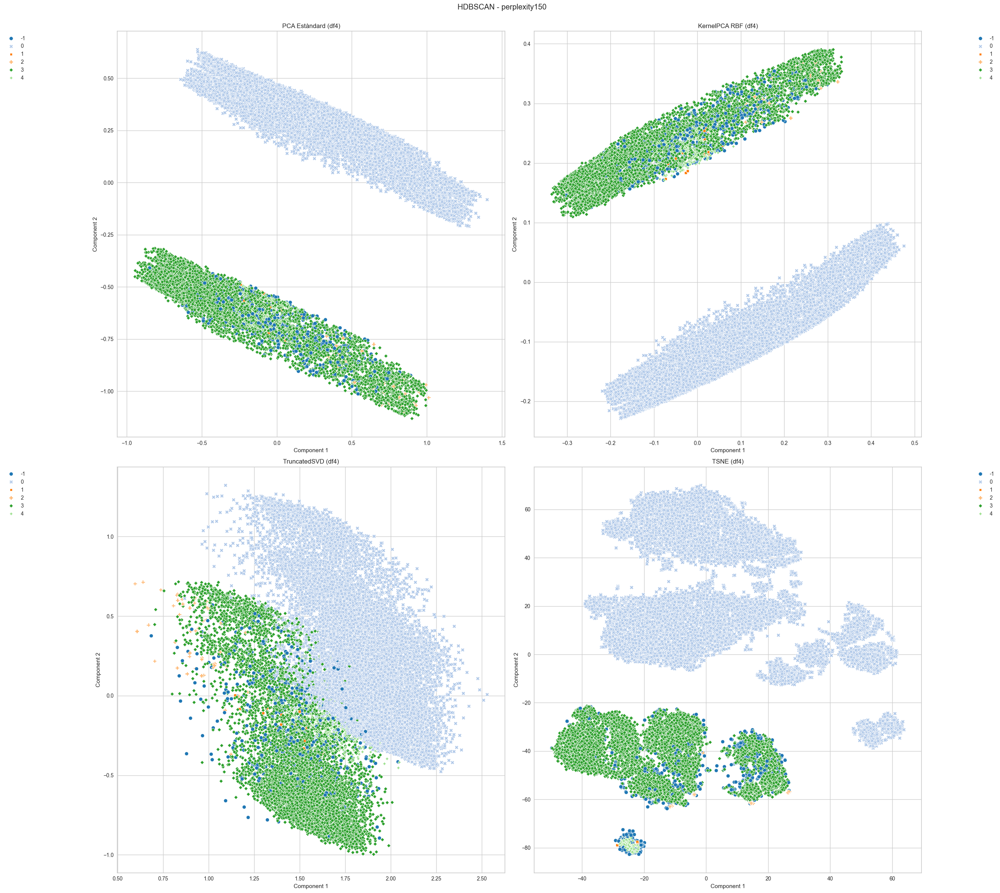

In [41]:
#HDBSCAN
fig, axes = plt.subplots(2, 2, figsize=(26, 24))

# 1. PCA Estàndard
#df4_sample_pca_2["Cluster"] = hdbscan1[sample_indices]
sns.scatterplot(data=df4_sample_pca_2, x='Component 1', y='Component 2', hue='hdbscan', style='hdbscan',
               palette='tab20', ax=axes[0, 0])
axes[0, 0].set_title('PCA Estàndard (df4)')
axes[0, 0].legend(loc=2, bbox_to_anchor=(-0.3, 1))

# 2. KernelPCA RBF
#df4_sample_kpca_2["Cluster"] = hdbscan1[sample_indices]
sns.scatterplot(data=df4_sample_kpca_2, x='Component 1', y='Component 2', hue='hdbscan',  style='hdbscan',
               palette='tab20', ax=axes[0, 1])
axes[0, 1].set_title('KernelPCA RBF (df4)')
axes[0, 1].legend(loc=1, bbox_to_anchor=(1.2, 1))

# 3. TruncatedSVD
#df4_sample_tsvd_2["Cluster"] = hdbscan1[sample_indices]
sns.scatterplot(data=df4_sample_tsvd_2, x='Component 1', y='Component 2', hue='hdbscan',  style='hdbscan',
               palette='tab20', ax=axes[1, 0])
axes[1, 0].set_title('TruncatedSVD (df4)')
axes[1, 0].legend(loc=2, bbox_to_anchor=(-0.3, 1))

# 4. TSNE
#df4_sample_tsne_2["Cluster"] = hdbscan1[sample_indices]
sns.scatterplot(data=df4_sample_tsne_2, x='Component 1', y='Component 2', hue='hdbscan', style='hdbscan',
               palette='tab20', ax=axes[1, 1])
axes[1, 1].set_title('TSNE (df4)')
axes[1, 1].legend(loc=1, bbox_to_anchor=(1.2, 1))

plt.tight_layout()
plt.suptitle(f"HDBSCAN - perplexity{tsne.perplexity}")
fig.subplots_adjust(top=0.95)
plt.legend(loc=1, bbox_to_anchor=(1.2, 1))
plt.show()

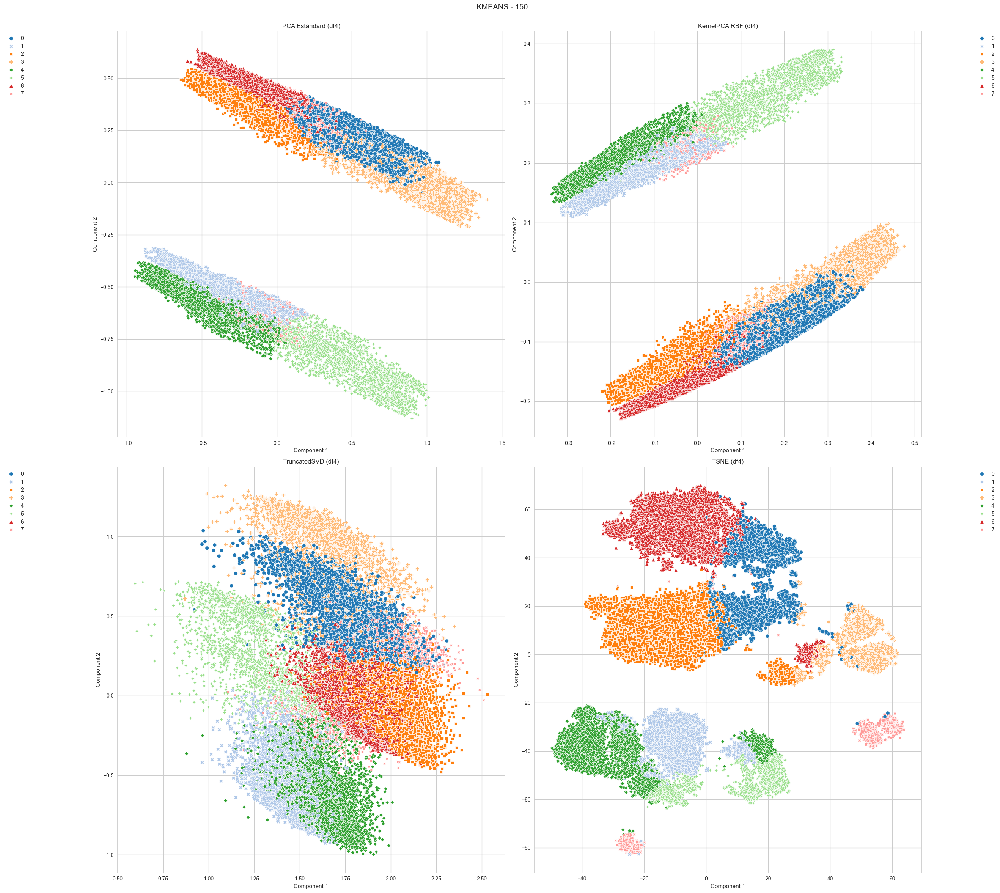

In [42]:
#KMEANS
fig, axes = plt.subplots(2, 2, figsize=(26, 24))

# 1. PCA Estàndard
#df4_sample_pca_2["Cluster"] = hdbscan1[sample_indices]
sns.scatterplot(data=df4_sample_pca_2, x='Component 1', y='Component 2', hue='kmeans', style='kmeans',
               palette='tab20', ax=axes[0, 0])
axes[0, 0].set_title('PCA Estàndard (df4)')
axes[0, 0].legend(loc=2, bbox_to_anchor=(-0.3, 1))

# 2. KernelPCA RBF
#df4_sample_kpca_2["Cluster"] = hdbscan1[sample_indices]
sns.scatterplot(data=df4_sample_kpca_2, x='Component 1', y='Component 2', hue='kmeans',  style='kmeans',
               palette='tab20', ax=axes[0, 1])
axes[0, 1].set_title('KernelPCA RBF (df4)')
axes[0, 1].legend(loc=1, bbox_to_anchor=(1.2, 1))

# 3. TruncatedSVD
#df4_sample_tsvd_2["Cluster"] = hdbscan1[sample_indices]
sns.scatterplot(data=df4_sample_tsvd_2, x='Component 1', y='Component 2', hue='kmeans',  style='kmeans',
               palette='tab20', ax=axes[1, 0])
axes[1, 0].set_title('TruncatedSVD (df4)')
axes[1, 0].legend(loc=2, bbox_to_anchor=(-0.3, 1))

# 4. TSNE
#df4_sample_tsne_2["Cluster"] = hdbscan1[sample_indices]
sns.scatterplot(data=df4_sample_tsne_2, x='Component 1', y='Component 2', hue='kmeans', style='kmeans',
               palette='tab20', ax=axes[1, 1])
axes[1, 1].set_title('TSNE (df4)')
axes[1, 1].legend(loc=1, bbox_to_anchor=(1.2, 1))

plt.tight_layout()
plt.suptitle(f"KMEANS - {tsne.perplexity}")
fig.subplots_adjust(top=0.95)
plt.legend(loc=1, bbox_to_anchor=(1.2, 1))
plt.show()

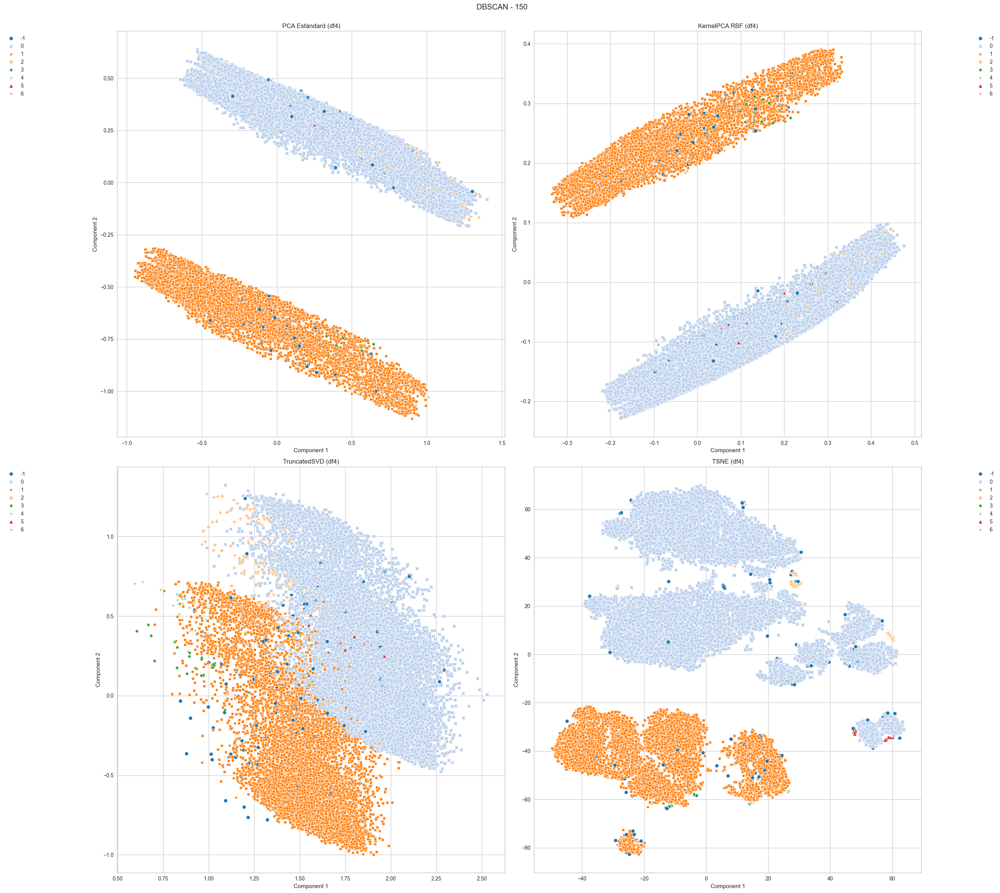

In [43]:
#DBSCAN
fig, axes = plt.subplots(2, 2, figsize=(26, 24))

# 1. PCA Estàndard
#df4_sample_pca_2["Cluster"] = hdbscan1[sample_indices]
sns.scatterplot(data=df4_sample_pca_2, x='Component 1', y='Component 2', hue='dbscan', style='dbscan',
               palette='tab20', ax=axes[0, 0])
axes[0, 0].set_title('PCA Estàndard (df4)')
axes[0, 0].legend(loc=2, bbox_to_anchor=(-0.3, 1))

# 2. KernelPCA RBF
#df4_sample_kpca_2["Cluster"] = hdbscan1[sample_indices]
sns.scatterplot(data=df4_sample_kpca_2, x='Component 1', y='Component 2', hue='dbscan',  style='dbscan',
               palette='tab20', ax=axes[0, 1])
axes[0, 1].set_title('KernelPCA RBF (df4)')
axes[0, 1].legend(loc=1, bbox_to_anchor=(1.2, 1))

# 3. TruncatedSVD
#df4_sample_tsvd_2["Cluster"] = hdbscan1[sample_indices]
sns.scatterplot(data=df4_sample_tsvd_2, x='Component 1', y='Component 2', hue='dbscan',  style='dbscan',
               palette='tab20', ax=axes[1, 0])
axes[1, 0].set_title('TruncatedSVD (df4)')
axes[1, 0].legend(loc=2, bbox_to_anchor=(-0.3, 1))

# 4. TSNE
#df4_sample_tsne_2["Cluster"] = hdbscan1[sample_indices]
sns.scatterplot(data=df4_sample_tsne_2, x='Component 1', y='Component 2', hue='dbscan', style='dbscan',
               palette='tab20', ax=axes[1, 1])
axes[1, 1].set_title('TSNE (df4)')
axes[1, 1].legend(loc=1, bbox_to_anchor=(1.2, 1))

plt.tight_layout()
plt.suptitle(f"DBSCAN - {tsne.perplexity}")
fig.subplots_adjust(top=0.95)
plt.legend(loc=1, bbox_to_anchor=(1.2, 1))
plt.show()

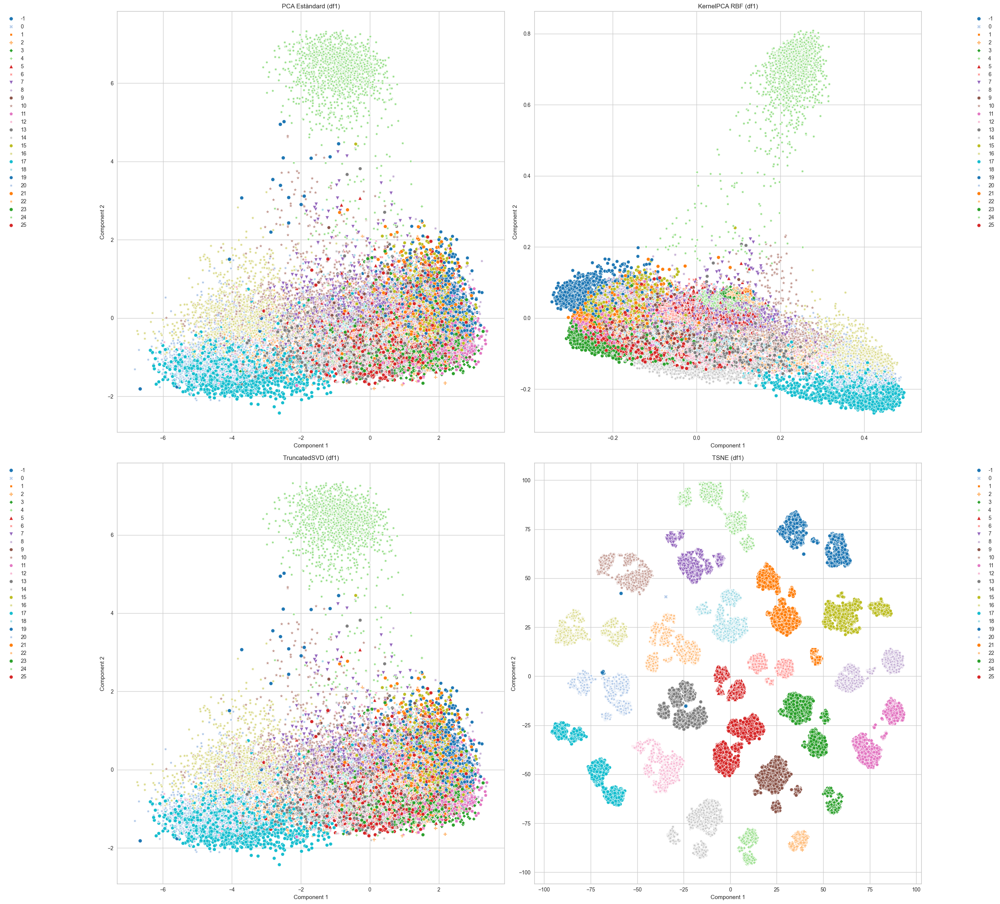

In [ ]:
#BASE NO EJECUTAR
fig, axes = plt.subplots(2, 2, figsize=(26, 24))

# 1. PCA Estàndard
pca_sample = PCA(n_components=2, random_state=42)
df4_sample_pca = pca_sample.fit_transform(df4_sample)

df4_sample_pca_2 = pd.DataFrame(data=df4_sample_pca, columns=['Component 1', 'Component 2'])
df4_sample_pca_2["Cluster"] = hdbscan1[sample_indices]
sns.scatterplot(data=df4_sample_pca_2, x='Component 1', y='Component 2', hue='Cluster', style='Cluster',
               palette='tab20', ax=axes[0, 0])
axes[0, 0].set_title('PCA Estàndard (df4)')
axes[0, 0].legend(loc=2, bbox_to_anchor=(-0.3, 1))

# 2. KernelPCA RBF
kpca_sample = KernelPCA(n_components=2, kernel='rbf', random_state=42, n_jobs=-1)
df4_sample_kpca = kpca_sample.fit_transform(df4_sample)

df4_sample_kpca_2 = pd.DataFrame(data=df4_sample_kpca, columns=['Component 1', 'Component 2'])
df4_sample_kpca_2["Cluster"] = hdbscan1[sample_indices]
sns.scatterplot(data=df4_sample_kpca_2, x='Component 1', y='Component 2', hue='Cluster',  style='Cluster',
               palette='tab20', ax=axes[0, 1])
axes[0, 1].set_title('KernelPCA RBF (df4)')
axes[0, 1].legend(loc=1, bbox_to_anchor=(1.2, 1))

# 3. TruncatedSVD
tsvd_sample = TruncatedSVD(n_components=2, random_state=42)
df4_sample_tsvd = tsvd_sample.fit_transform(df4_sample)

df4_sample_tsvd_2 = pd.DataFrame(data=df4_sample_tsvd, columns=['Component 1', 'Component 2'])
df4_sample_tsvd_2["Cluster"] = hdbscan1[sample_indices]
sns.scatterplot(data=df4_sample_tsvd_2, x='Component 1', y='Component 2', hue='Cluster',  style='Cluster',
               palette='tab20', ax=axes[1, 0])
axes[1, 0].set_title('TruncatedSVD (df4)')
axes[1, 0].legend(loc=2, bbox_to_anchor=(-0.3, 1))

# 4. TSNE
tsne = TSNE(n_components=2, perplexity=50, learning_rate='auto', random_state=42)
df4_sample_tsne = tsne.fit_transform(df4_sample)
df4_sample_tsne_2 = pd.DataFrame(data=df4_sample_tsne, columns=['Component 1', 'Component 2'])
df4_sample_tsne_2["Cluster"] = hdbscan1[sample_indices]

sns.scatterplot(data=df4_sample_tsne_2, x='Component 1', y='Component 2', hue='Cluster', style='Cluster',
               palette='tab20', ax=axes[1, 1])
axes[1, 1].set_title('TSNE (df4)')
axes[1, 1].legend(loc=1, bbox_to_anchor=(1.2, 1))

plt.tight_layout()
plt.legend(loc=1, bbox_to_anchor=(1.2, 1))
plt.show()

# H) Anàlisi

<Axes: ylabel='label'>

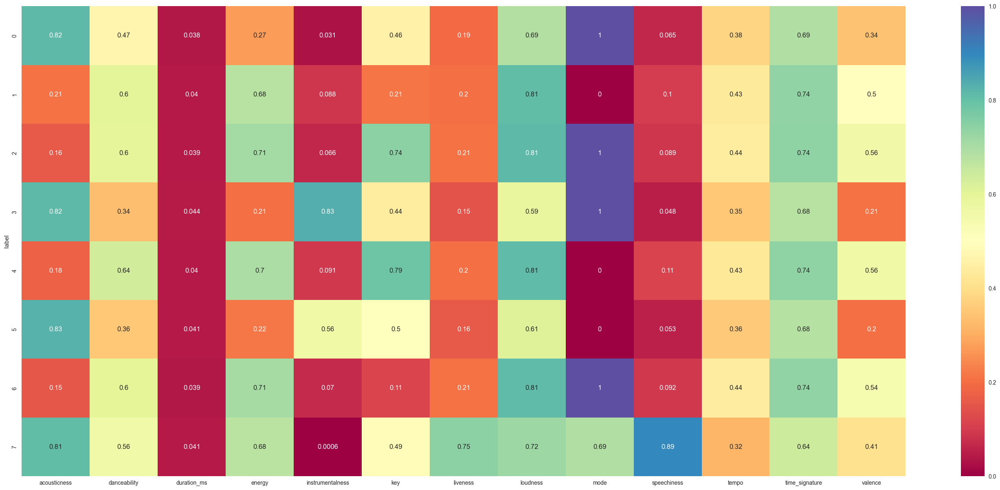

In [44]:
df4_kmeans1 = pd.DataFrame(data=data4_scal, columns=df4.columns)
df4_kmeans1["label"] = kmeans1

tmp = df4_kmeans1.groupby(by=["label"]).mean()

plt.figure(figsize=(35, 15))
sns.heatmap(tmp, cmap="Spectral", annot=True)

C:\Users\gaofu\AppData\Local\Temp\ipykernel_2424\4058916448.py:4: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df4_kmeans1, x=c, hue="label", ax=axes[i])
C:\Users\gaofu\AppData\Local\Temp\ipykernel_2424\4058916448.py:4: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(df4_kmeans1, x=c, hue="label", ax=axes[i])


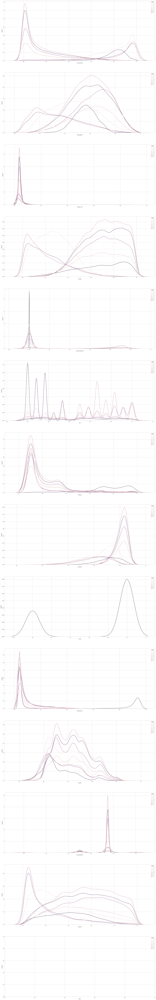

In [45]:
fig, axes = plt.subplots(len(df4_kmeans1.columns), figsize=(30, 200))

for i, c in enumerate(df4_kmeans1.columns): 
    sns.kdeplot(df4_kmeans1, x=c, hue="label", ax=axes[i])

plt.show()

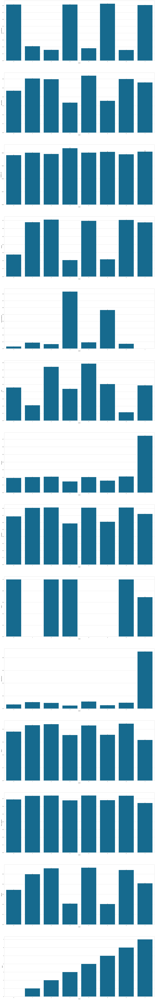

In [46]:
fig, axes = plt.subplots(len(df4_kmeans1.columns), figsize=(30, 200))

for i, c in enumerate(df4_kmeans1.columns): 
    sns.barplot(df4_kmeans1, y=c, x="label", ax=axes[i])

plt.show()

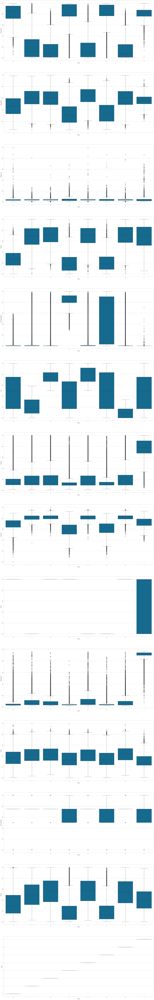

In [47]:
fig, axes = plt.subplots(len(df4_kmeans1.columns), figsize=(30, 200))

for i, c in enumerate(df4_kmeans1.columns): 
    sns.boxplot(df4_kmeans1, x="label", y=c, ax=axes[i])

plt.show()

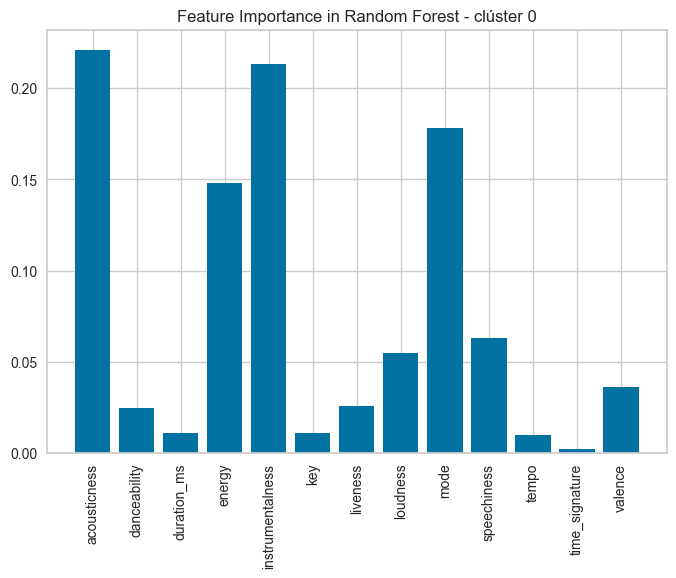

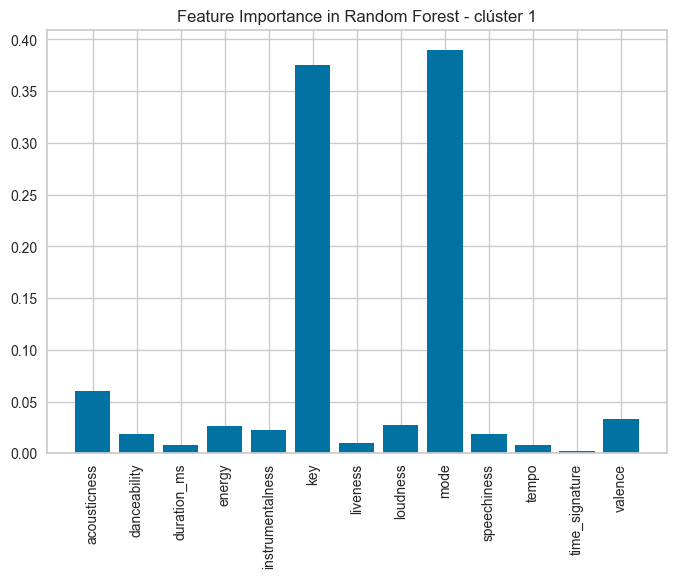

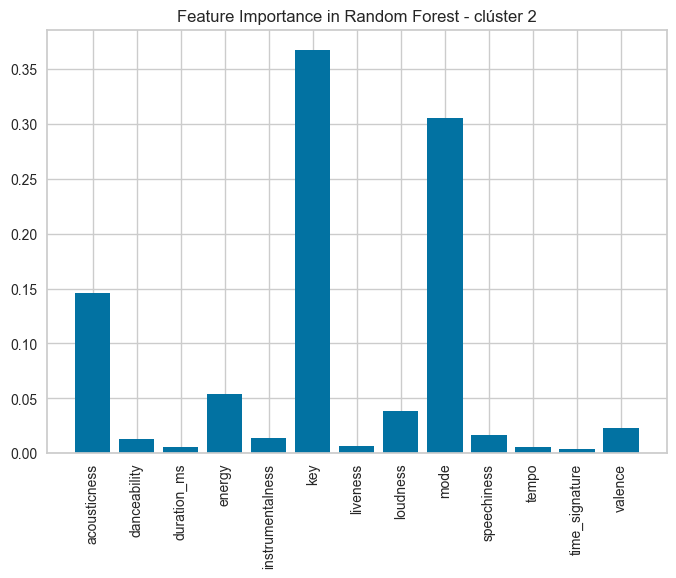

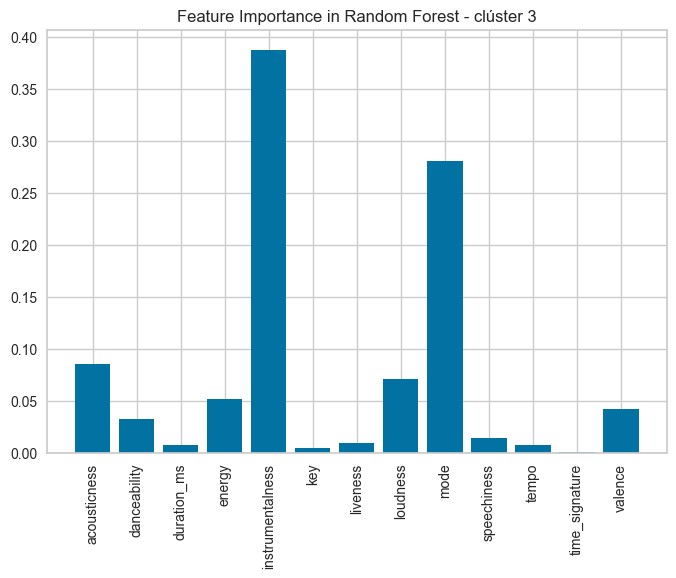

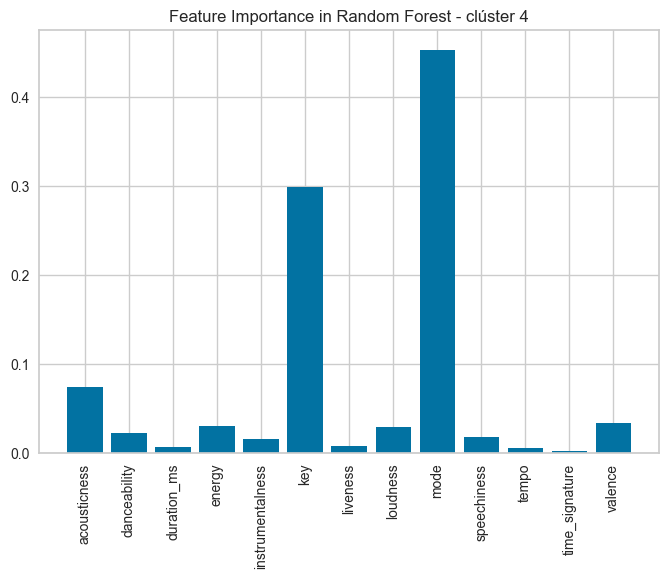

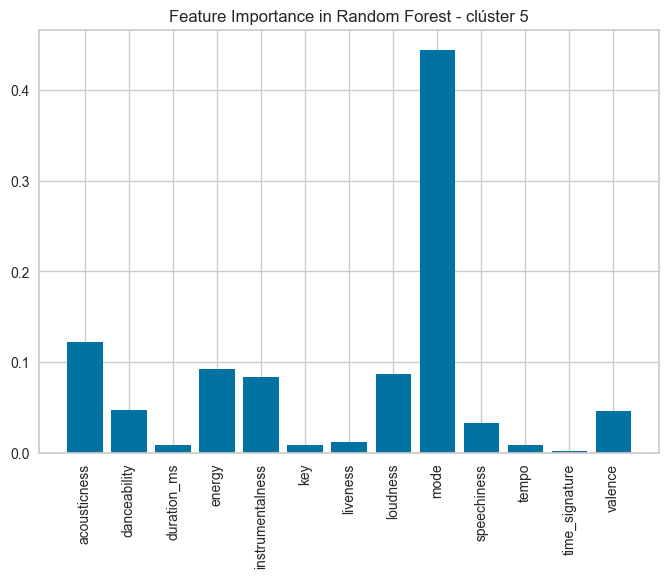

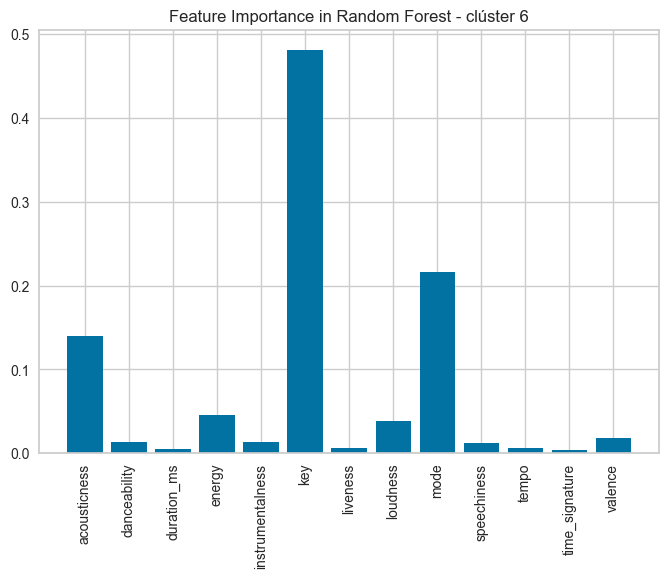

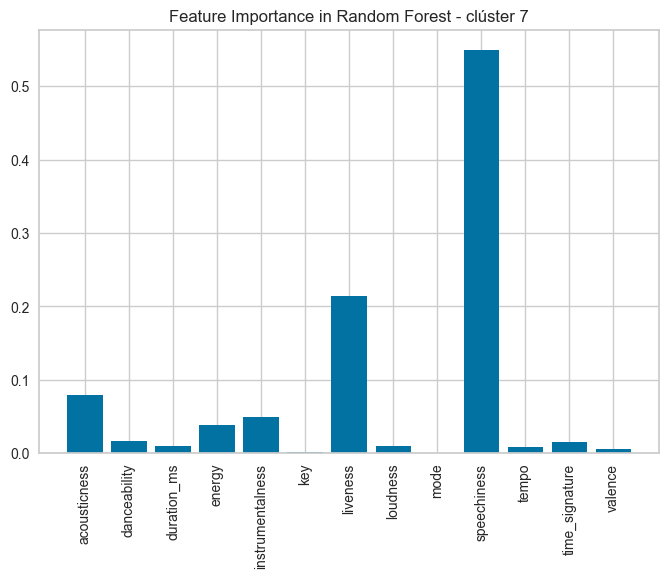

In [50]:
from sklearn.ensemble import RandomForestClassifier


for i in range(len(set(kmeans1))):
    df4_kmeans1["cluster_"+str(i)] = (df4_kmeans1["label"] == i)

    clf = RandomForestClassifier(random_state=1)
    clf.fit(df4_kmeans1.iloc[:, 0:13].values, df4_kmeans1["cluster_"+str(i)].values)

    importance = clf.feature_importances_
    #plt.bar(range(num.shape[1]), importance)
    plt.bar(range(13), importance)
    plt.xticks(range(13), df4_kmeans1.columns[0:13], rotation=90)
    plt.title("Feature Importance in Random Forest - clúster " + str(i))
    plt.show()

In [65]:
#pd.DataFrame(data=scaler.inverse_transform(tmp), columns=df.columns)
tmp1 = pd.DataFrame(data=tmp, columns=df.columns)
scaler.fit(df4[["duration_ms"]])
tmp1["duration_ms"] = scaler.inverse_transform(tmp[["duration_ms"]])

scaler.fit(df4[["loudness"]])
tmp1["loudness"] = scaler.inverse_transform(tmp[["loudness"]])

scaler.fit(df4[["tempo"]])
tmp1["tempo"] = scaler.inverse_transform(tmp[["tempo"]])

scaler.fit(df4[["key"]])
tmp1["key"] = scaler.inverse_transform(tmp[["key"]])

scaler.fit(df4[["time_signature"]])
tmp1["time_signature"] = scaler.inverse_transform(tmp[["time_signature"]])
tmp1

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
label,,,,,,,,,,,,,
0,0.815399,0.467759,227353.364937,0.274807,0.030705,6.479681,0.192524,-13.877498,1.000000,0.065175,111.329487,3.758640,0.343430
1,0.208983,0.604673,237757.765043,0.678434,0.087720,3.534051,0.203463,-7.054029,0.000000,0.101392,121.972703,3.946749,0.498558
2,0.156529,0.596626,232193.689492,0.710437,0.065586,9.915537,0.208199,-6.745644,1.000000,0.088805,123.618077,3.959804,0.556742
3,0.815627,0.335389,256981.463292,0.205538,0.833862,6.258733,0.145875,-19.507621,1.000000,0.047921,105.712960,3.711694,0.207048
4,0.179448,0.636657,237945.534915,0.695391,0.091260,10.441279,0.203643,-6.915981,0.000000,0.110791,121.528847,3.964040,0.562834
5,0.827134,0.355404,241431.671988,0.215227,0.564727,7.047619,0.156584,-18.171969,0.000000,0.052730,106.113548,3.719884,0.203289
6,0.154337,0.598717,230957.967528,0.706749,0.070015,2.374950,0.210706,-6.796861,1.000000,0.092437,124.534817,3.952597,0.539901
7,0.807681,0.560725,242158.582193,0.675691,0.000597,6.837192,0.745126,-11.929367,0.689539,0.894976,97.513039,3.572406,0.407777


# Random songs

In [66]:
cluster_labels = sorted([label for label in set(kmeans1) if label != -1]) #totes les labels del model
sizes = {label: int((kmeans1 == label).sum()) for label in cluster_labels} #quanitat de cancos en cada label

random_index = np.random.RandomState(42).randint(len(data4_scal)) #index de canço random
random_label = kmeans1[random_index] #label de canço random

cluster_index = np.where(kmeans1 == random_label)[0] #index de cancons amb label de canço random 

recomancio = 2
random_recomancio_index = np.random.RandomState(42).choice(cluster_index, size=recomancio, replace=False) #index de 

#print("Nom canço:", canciones.loc[:, "track_name"][random_index].values)
#print("Nom artista:", canciones.loc[:, "artist_name"][random_index].values)
print("Nom canço:", canciones["track_name"][random_index])
print("Nom artista:", canciones["artist_name"][random_index])
print("Label:", kmeans1[random_index])
print("Cançons disponibles:", sizes[random_label])
print("Info:", df.iloc[random_index])

for i in range(recomancio): 
    print("RECOMANCIO", i)
    print("Nom canço:", canciones["track_name"][random_recomancio_index[i]])
    print("Nom artista:", canciones["artist_name"][random_recomancio_index[i]])
    print("Label:", kmeans1[random_recomancio_index[i]])
    print("Info:", df.iloc[random_recomancio_index[i]])

Nom canço: Donde Esta Mi Gata
Nom artista: Yandel
Label: 6
Cançons disponibles: 32551
Info: acousticness           0.113
danceability            0.79
duration_ms           164347
energy                 0.808
instrumentalness    0.000009
key                        D
liveness               0.222
loudness              -5.194
mode                   Major
speechiness           0.0522
tempo                 96.005
time_signature           4/4
valence                0.677
Name: 121958, dtype: object
RECOMANCIO 0
Nom canço: Reggae Night
Nom artista: Jimmy Cliff
Label: 6
Info: acousticness           0.282
danceability           0.853
duration_ms           321600
energy                 0.697
instrumentalness    0.000044
key                        C
liveness               0.121
loudness               -7.41
mode                   Major
speechiness           0.0373
tempo                109.419
time_signature           4/4
valence                 0.96
Name: 100026, dtype: object
RECOMANCIO 1
Nom canç